# **Gender Recognition By Voice And Speech Analysis!**

In [1]:
import numpy as np 
import pandas as pd 
import matplotlib.pyplot as plt
import seaborn as sns

import warnings
warnings.filterwarnings('ignore')

In [2]:
df = pd.read_csv("voice.csv")
df.head()

,meanfreq,sd,median,Q25,Q75,IQR,skew,kurt,sp.ent,sfm,mode,centroid,meanfun,minfun,maxfun,meandom,mindom,maxdom,dfrange,modindx,label
0,0.059781,0.064241,0.032027,0.015071,0.090193,0.075122,12.863462,274.402906,0.893369,0.491918,0.000000,0.059781,0.084279,0.015702,0.275862,0.007812,0.007812,0.007812,0.000000,0.000000,male
1,0.066009,0.067310,0.040229,0.019414,0.092666,0.073252,22.423285,634.613855,0.892193,0.513724,0.000000,0.066009,0.107937,0.015826,0.250000,0.009014,0.007812,0.054688,0.046875,0.052632,male
2,0.077316,0.083829,0.036718,0.008701,0.131908,0.123207,30.757155,1024.927705,0.846389,0.478905,0.000000,0.077316,0.098706,0.015656,0.271186,0.007990,0.007812,0.015625,0.007812,0.046512,male
3,0.151228,0.072111,0.158011,0.096582,0.207955,0.111374,1.232831,4.177296,0.963322,0.727232,0.083878,0.151228,0.088965,0.017798,0.250000,0.201497,0.007812,0.562500,0.554688,0.247119,male
4,0.135120,0.079146,0.124656,0.078720,0.206045,0.127325,1.101174,4.333713,0.971955,0.783568,0.104261,0.135120,0.106398,0.016931,0.266667,0.712812,0.007812,5.484375,5.476562,0.208274,male


In [3]:
df.shape

(3168, 21)

In [4]:
df.columns

Index(['meanfreq', 'sd', 'median', 'Q25', 'Q75', 'IQR', 'skew', 'kurt',
       'sp.ent', 'sfm', 'mode', 'centroid', 'meanfun', 'minfun', 'maxfun',
       'meandom', 'mindom', 'maxdom', 'dfrange', 'modindx', 'label'],
      dtype='object')

### Data Description

The following acoustic properties of each voice are measured and included within the CSV:

* meanfreq: mean frequency (in kHz)
* sd: standard deviation of frequency
* median: median frequency (in kHz)
* Q25: first quantile (in kHz)
* Q75: third quantile (in kHz)
* IQR: interquantile range (in kHz)
* skew: skewness (see note in specprop description)
* kurt: kurtosis (see note in specprop description)
* sp.ent: spectral entropy
* sfm: spectral flatness
* mode: mode frequency
* centroid: frequency centroid (see specprop)
* peakf: peak frequency (frequency with highest energy)
* meanfun: average of fundamental frequency measured across acoustic signal
* minfun: minimum fundamental frequency measured across acoustic signal
* maxfun: maximum fundamental frequency measured across acoustic signal
* meandom: average of dominant frequency measured across acoustic signal
* mindom: minimum of dominant frequency measured across acoustic signal
* maxdom: maximum of dominant frequency measured across acoustic signal
* dfrange: range of dominant frequency measured across acoustic signal
* modindx: modulation index. Calculated as the accumulated absolute - difference between adjacent measurements of fundamental frequencies divided by the frequency range
* **label: male or female**

Checking for missing values

In [5]:
print(df.isnull().sum())
print("Total number of labels: {}".format(df.shape[0]))
print("Number of male: {}".format(df[df.label == 'male'].shape[0]))
print("Number of female: {}".format(df[df.label == 'female'].shape[0]))

meanfreq    0
sd          0
median      0
Q25         0
Q75         0
IQR         0
skew        0
kurt        0
sp.ent      0
sfm         0
mode        0
centroid    0
meanfun     0
minfun      0
maxfun      0
meandom     0
mindom      0
maxdom      0
dfrange     0
modindx     0
label       0
dtype: int64
Total number of labels: 3168
Number of male: 1584
Number of female: 1584


No missing values

### EDA (Exploratory Data Analysis):

In [6]:
df.describe()

,meanfreq,sd,median,Q25,Q75,IQR,skew,kurt,sp.ent,sfm,mode,centroid,meanfun,minfun,maxfun,meandom,mindom,maxdom,dfrange,modindx
count,3168.000000,3168.000000,3168.000000,3168.000000,3168.000000,3168.000000,3168.000000,3168.000000,3168.000000,3168.000000,3168.000000,3168.000000,3168.000000,3168.000000,3168.000000,3168.000000,3168.000000,3168.000000,3168.000000,3168.000000
mean,0.180907,0.057126,0.185621,0.140456,0.224765,0.084309,3.140168,36.568461,0.895127,0.408216,0.165282,0.180907,0.142807,0.036802,0.258842,0.829211,0.052647,5.047277,4.994630,0.173752
std,0.029918,0.016652,0.036360,0.048680,0.023639,0.042783,4.240529,134.928661,0.044980,0.177521,0.077203,0.029918,0.032304,0.019220,0.030077,0.525205,0.063299,3.521157,3.520039,0.119454
min,0.039363,0.018363,0.010975,0.000229,0.042946,0.014558,0.141735,2.068455,0.738651,0.036876,0.000000,0.039363,0.055565,0.009775,0.103093,0.007812,0.004883,0.007812,0.000000,0.000000
25%,0.163662,0.041954,0.169593,0.111087,0.208747,0.042560,1.649569,5.669547,0.861811,0.258041,0.118016,0.163662,0.116998,0.018223,0.253968,0.419828,0.007812,2.070312,2.044922,0.099766
50%,0.184838,0.059155,0.190032,0.140286,0.225684,0.094280,2.197101,8.318463,0.901767,0.396335,0.186599,0.184838,0.140519,0.046110,0.271186,0.765795,0.023438,4.992188,4.945312,0.139357
75%,0.199146,0.067020,0.210618,0.175939,0.243660,0.114175,2.931694,13.648905,0.928713,0.533676,0.221104,0.199146,0.169581,0.047904,0.277457,1.177166,0.070312,7.007812,6.992188,0.209183
max,0.251124,0.115273,0.261224,0.247347,0.273469,0.252225,34.725453,1309.612887,0.981997,0.842936,0.280000,0.251124,0.237636,0.204082,0.279114,2.957682,0.458984,21.867188,21.843750,0.932374


#### Data Exploration  

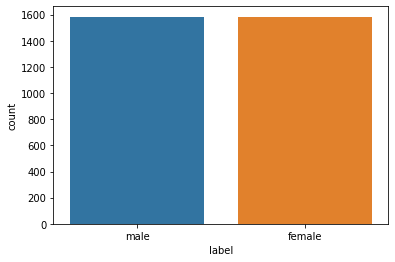

In [7]:
# To check if the dataset is balanced:

sns.countplot(x="label", data = df)

The data is equally balanced.

**Univariate Analysis**

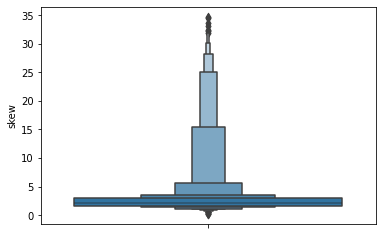

In [8]:
sns.boxenplot(y="skew", data=df)

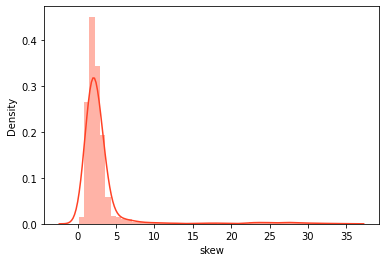

In [9]:
#sns.kdeplot(x="skew", data=df, fill= True, alpha=.5, linewidth=0)
sns.distplot(a=df['skew'],color='#ff4125')

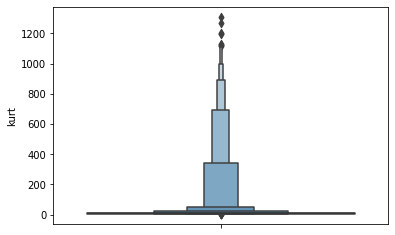

In [10]:
sns.boxenplot(y="kurt", data=df)

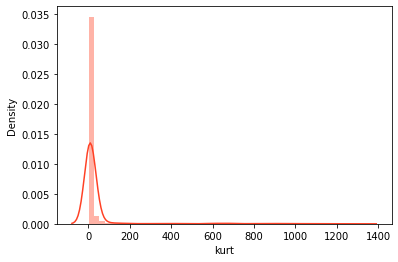

In [11]:
#sns.kdeplot(x="kurt", data=df, fill= True, alpha=.5, linewidth=0)
sns.distplot(a=df['kurt'],color='#ff4125')

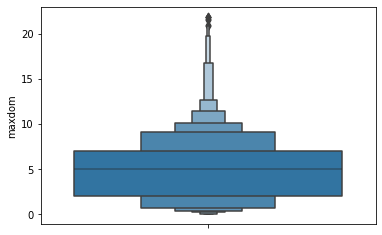

In [12]:
sns.boxenplot(y="maxdom", data=df)

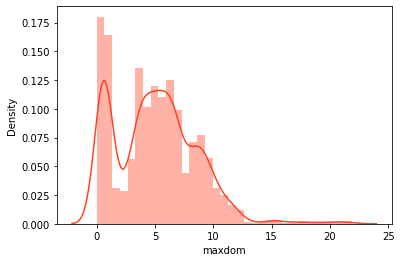

In [13]:
#sns.kdeplot(x="maxdom", data=df, fill= True, alpha=.5, linewidth=0)
sns.distplot(a=df['maxdom'],color='#ff4125')

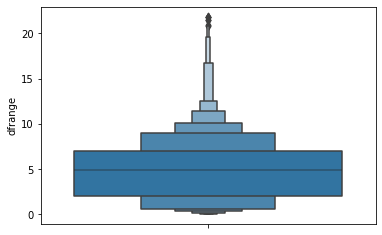

In [14]:
sns.boxenplot(y="dfrange", data=df)

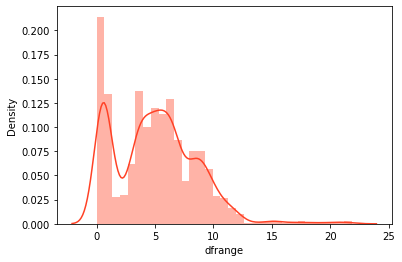

In [15]:
#sns.kdeplot(x="dfrange", data=df, fill= True, alpha=.5, linewidth=0)
sns.distplot(a=df['dfrange'],color='#ff4125')

**Bivariate Analysis**

Changing the value of label:
* male: 1
* female: 0

In [16]:
df['label'] = df['label'].replace({'male':1, 'female':0})

catplot
pairplot


In [17]:
df.head()

,meanfreq,sd,median,Q25,Q75,IQR,skew,kurt,sp.ent,sfm,mode,centroid,meanfun,minfun,maxfun,meandom,mindom,maxdom,dfrange,modindx,label
0,0.059781,0.064241,0.032027,0.015071,0.090193,0.075122,12.863462,274.402906,0.893369,0.491918,0.000000,0.059781,0.084279,0.015702,0.275862,0.007812,0.007812,0.007812,0.000000,0.000000,1
1,0.066009,0.067310,0.040229,0.019414,0.092666,0.073252,22.423285,634.613855,0.892193,0.513724,0.000000,0.066009,0.107937,0.015826,0.250000,0.009014,0.007812,0.054688,0.046875,0.052632,1
2,0.077316,0.083829,0.036718,0.008701,0.131908,0.123207,30.757155,1024.927705,0.846389,0.478905,0.000000,0.077316,0.098706,0.015656,0.271186,0.007990,0.007812,0.015625,0.007812,0.046512,1
3,0.151228,0.072111,0.158011,0.096582,0.207955,0.111374,1.232831,4.177296,0.963322,0.727232,0.083878,0.151228,0.088965,0.017798,0.250000,0.201497,0.007812,0.562500,0.554688,0.247119,1
4,0.135120,0.079146,0.124656,0.078720,0.206045,0.127325,1.101174,4.333713,0.971955,0.783568,0.104261,0.135120,0.106398,0.016931,0.266667,0.712812,0.007812,5.484375,5.476562,0.208274,1


Correlation betweeen data features

Text(0.5, 1.0, 'Correlation Matrix')

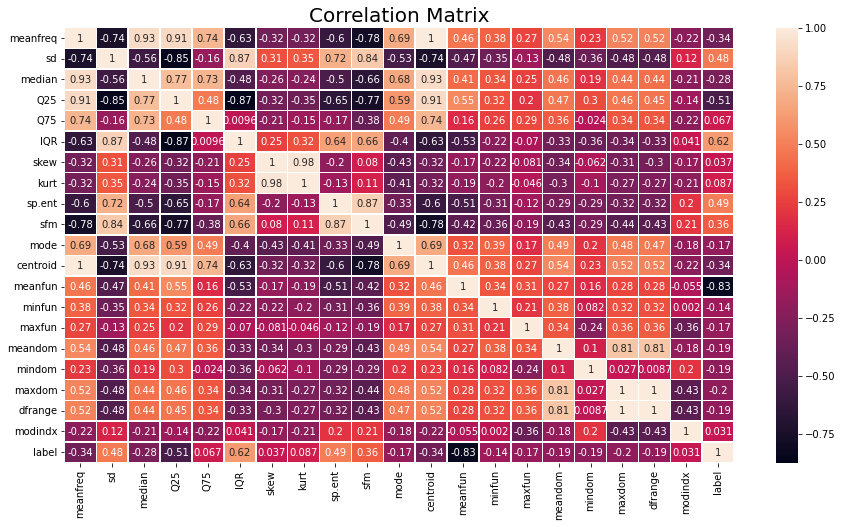

In [18]:
plt.figure(figsize=(15,8))
sns.heatmap(df.corr(), annot=True,cmap='rocket', linewidths='.5')
plt.title('Correlation Matrix', fontsize = 20)

Observation:
1. IQR is the most correlated feature with the target label.
2. median and centroid(), meanfreq and centroid are equally corelated with label, so we can delete centroid.

<Figure size 648x648 with 0 Axes>

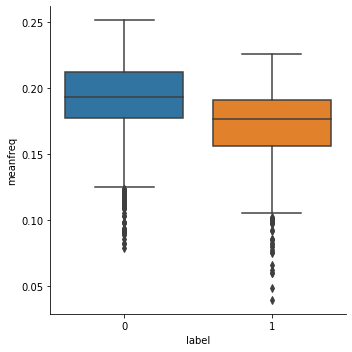

In [19]:
plt.figure(figsize=(9,9))
sns.factorplot(data=df, y='meanfreq', x='label', kind='box')

females have higher mean frequency than males

<Figure size 648x648 with 0 Axes>

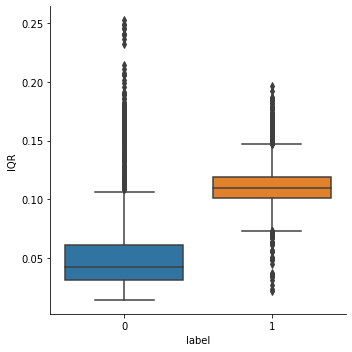

In [20]:
plt.figure(figsize=(9,9))
sns.factorplot(data=df, y='IQR', x='label', kind='box')

There is a strong relation between IQR and label.

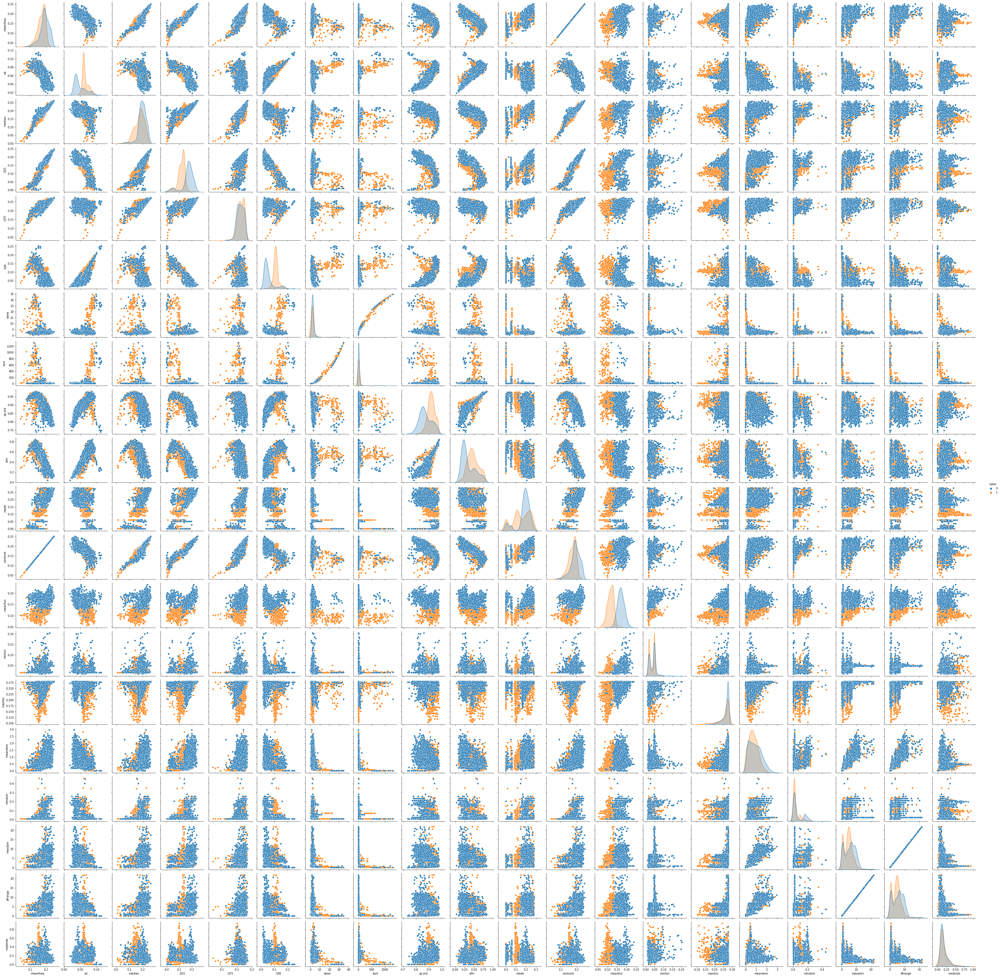

In [21]:
sns.pairplot(df, hue = "label")
plt.show()  

### **Importing Packages**

In [22]:
# scaling
from sklearn.preprocessing import StandardScaler, LabelEncoder, MinMaxScaler

# models
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, confusion_matrix
from sklearn.svm import LinearSVC
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import GradientBoostingClassifier

# model selection
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
from sklearn.model_selection import GridSearchCV

In [23]:
scaler = StandardScaler()
scaled_df=scaler.fit_transform(df.drop('label', axis=1))
X=scaled_df
Y=df['label'].values

In [24]:
X_train, X_test, y_train, y_test = train_test_split(X,Y, test_size=0.2, random_state = 2)

In [25]:
print(X_train.shape)
print(X_test.shape)
print(y_train.shape)
print(y_test.shape)

(2534, 20)
(634, 20)
(2534,)
(634,)


#### Logistic regression model

In [26]:
LR_model = LogisticRegression()
LR_model.fit(X_train, y_train)
LR_y_pred = LR_model.predict(X_test)

print("Accuracy score using LR model is : ", accuracy_score(y_test, LR_y_pred))
print("\nConfusion matrix using LR model is : \n", confusion_matrix(y_test, LR_y_pred))
print("\nClassification using LR model is : \n", classification_report(y_test, LR_y_pred))

Accuracy score using LR model is :  0.9700315457413249

Confusion matrix using LR model is : 
 [[326  12]
 [  7 289]]

Classification using LR model is : 
               precision    recall  f1-score   support

           0       0.98      0.96      0.97       338
           1       0.96      0.98      0.97       296

    accuracy                           0.97       634
   macro avg       0.97      0.97      0.97       634
weighted avg       0.97      0.97      0.97       634



#### Decision tree model

In [27]:
DT_model = DecisionTreeClassifier(criterion='entropy')
DT_model.fit(X_train, y_train)
DT_y_pred = DT_model.predict(X_test)

print("Accuracy score using DT model is : ", accuracy_score(y_test, DT_y_pred))
print("\nConfusion matrix using DT model is : \n", confusion_matrix(y_test, DT_y_pred))
print("\nClassification using DT model is : \n", classification_report(y_test, DT_y_pred))

Accuracy score using DT model is :  0.9668769716088328

Confusion matrix using DT model is : 
 [[326  12]
 [  9 287]]

Classification using DT model is : 
               precision    recall  f1-score   support

           0       0.97      0.96      0.97       338
           1       0.96      0.97      0.96       296

    accuracy                           0.97       634
   macro avg       0.97      0.97      0.97       634
weighted avg       0.97      0.97      0.97       634



#### K Nearest Neighbor

In [28]:
KNN_model = KNeighborsClassifier(n_neighbors= 7)
KNN_model.fit(X_train, y_train)
KNN_y_pred = KNN_model.predict(X_test)

print("Accuracy score using KNN model is : ", accuracy_score(y_test, KNN_y_pred))
print("\nConfusion matrix using KNN model is : \n", confusion_matrix(y_test, KNN_y_pred))
print("\nClassification using KNN model is : \n", classification_report(y_test, KNN_y_pred))

Accuracy score using KNN model is :  0.9589905362776026

Confusion matrix using KNN model is : 
 [[322  16]
 [ 10 286]]

Classification using KNN model is : 
               precision    recall  f1-score   support

           0       0.97      0.95      0.96       338
           1       0.95      0.97      0.96       296

    accuracy                           0.96       634
   macro avg       0.96      0.96      0.96       634
weighted avg       0.96      0.96      0.96       634



#### Support Vector Model

In [29]:
SVM_model = SVC(kernel='linear')
SVM_model.fit(X_train, y_train)
SVM_y_pred = SVM_model.predict(X_test)

print("Accuracy score using SVM model is : ", accuracy_score(y_test, SVM_y_pred))
print("\nConfusion matrix using SVM model is : \n", confusion_matrix(y_test, SVM_y_pred))
print("\nClassification using SVM model is : \n", classification_report(y_test, SVM_y_pred))

Accuracy score using SVM model is :  0.9716088328075709

Confusion matrix using SVM model is : 
 [[328  10]
 [  8 288]]

Classification using SVM model is : 
               precision    recall  f1-score   support

           0       0.98      0.97      0.97       338
           1       0.97      0.97      0.97       296

    accuracy                           0.97       634
   macro avg       0.97      0.97      0.97       634
weighted avg       0.97      0.97      0.97       634



#### Random Forest

In [30]:
RF_model = RandomForestClassifier(n_estimators= 100, criterion= 'entropy')
RF_model.fit(X_train, y_train)
RF_y_pred = RF_model.predict(X_test)

print("Accuracy score using RF model is : ", accuracy_score(y_test, RF_y_pred))
print("\nConfusion matrix using RF model is : \n", confusion_matrix(y_test, RF_y_pred))
print("\nClassification using RF model is : \n", classification_report(y_test, RF_y_pred))

Accuracy score using RF model is :  0.9747634069400631

Confusion matrix using RF model is : 
 [[329   9]
 [  7 289]]

Classification using RF model is : 
               precision    recall  f1-score   support

           0       0.98      0.97      0.98       338
           1       0.97      0.98      0.97       296

    accuracy                           0.97       634
   macro avg       0.97      0.97      0.97       634
weighted avg       0.97      0.97      0.97       634

